In [1]:
from stardist.models import StarDist2D
import tifffile as tiff
import glob
import os
import numpy as np

In [2]:
def read_image(image_path):   
    with tiff.TiffFile(image_path) as tif:
        image_array = tif.asarray()
    # image_array = np.uint8(image_array)
    return image_array

In [3]:
exp = 'T19'
t2_im_path = glob.glob(f'G:/2024_code/{exp}/raw/*{exp}*HnE*.tif*')[0]
t2_im = read_image(t2_im_path)

In [8]:
import histomicstk as htk

stain_colour_map = {'hematoxylin': [0.52, 0.74, 0.42],
                            'eosin':       [0.27, 0.71, 0.65],
                            'dab':         [0.27, 0.57, 0.78],
                            'null':        [0.00, 0.00, 0.00],
                            }

# Create stain matrix
W = np.array([stain_colour_map['hematoxylin'],
                stain_colour_map['eosin'],
                stain_colour_map['null']]).T

# im_sda = htk.preprocessing.color_conversion.rgb_to_sda(t2_im, 255)
# W_est = htk.preprocessing.color_deconvolution.separate_stains_xu_snmf(im_sda, W, 0.5)
W_est = htk.preprocessing.color_deconvolution.rgb_separate_stains_macenko_pca(t2_im, 255)

im_deconv = htk.preprocessing.color_deconvolution.color_deconvolution(t2_im, htk.preprocessing.color_deconvolution.complement_stain_matrix(W_est), 255)

im_nuclei_stain = im_deconv.Stains[:, :, 0]







# print('Performing color deconvolution...')
# # Perform standard color deconvolution
# im_stains = htk.preprocessing.color_deconvolution.color_deconvolution(t2_im, W).Stains  
# im_nuclei_stain = im_stains.Stains[:, :, 0]
# print('Completed color deconvolution.')


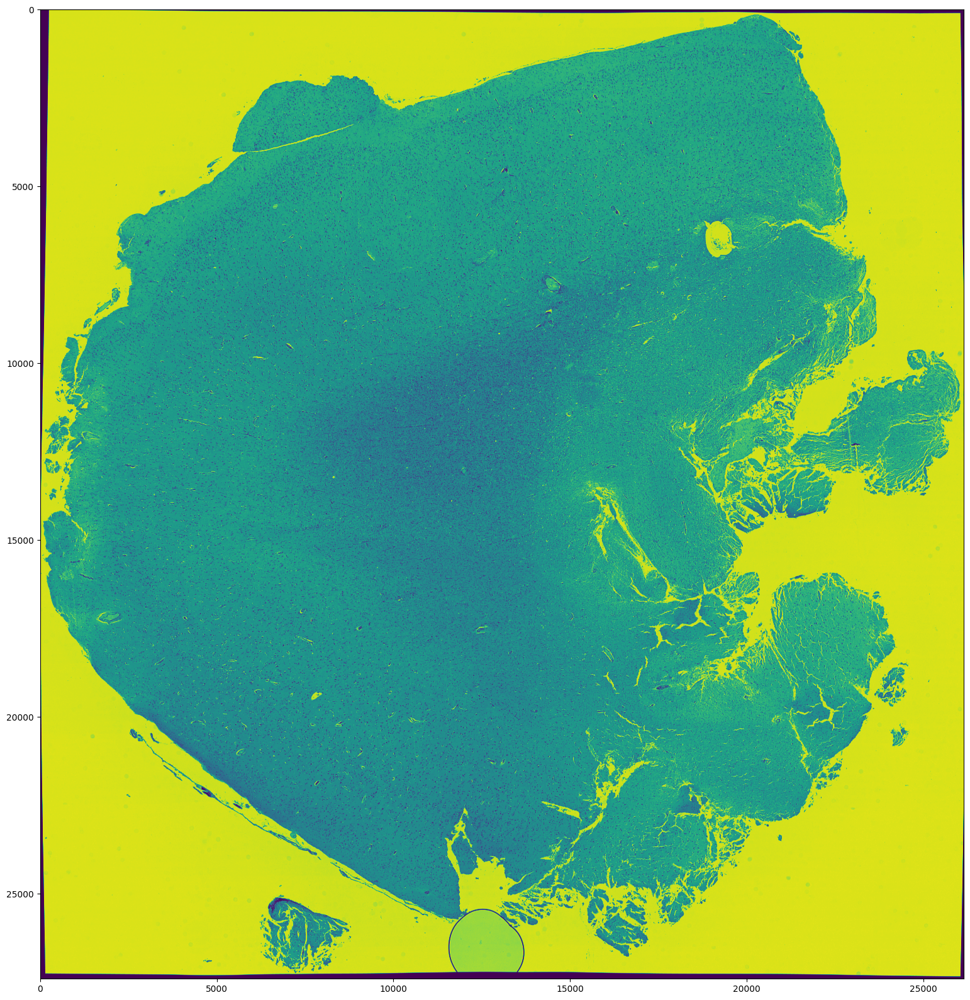

In [17]:
import matplotlib.pyplot as plt

plt.figure(figsize=(20,20))
plt.imshow(im_nuclei_stain)

Performing color deconvolution...
Completed color deconvolution.


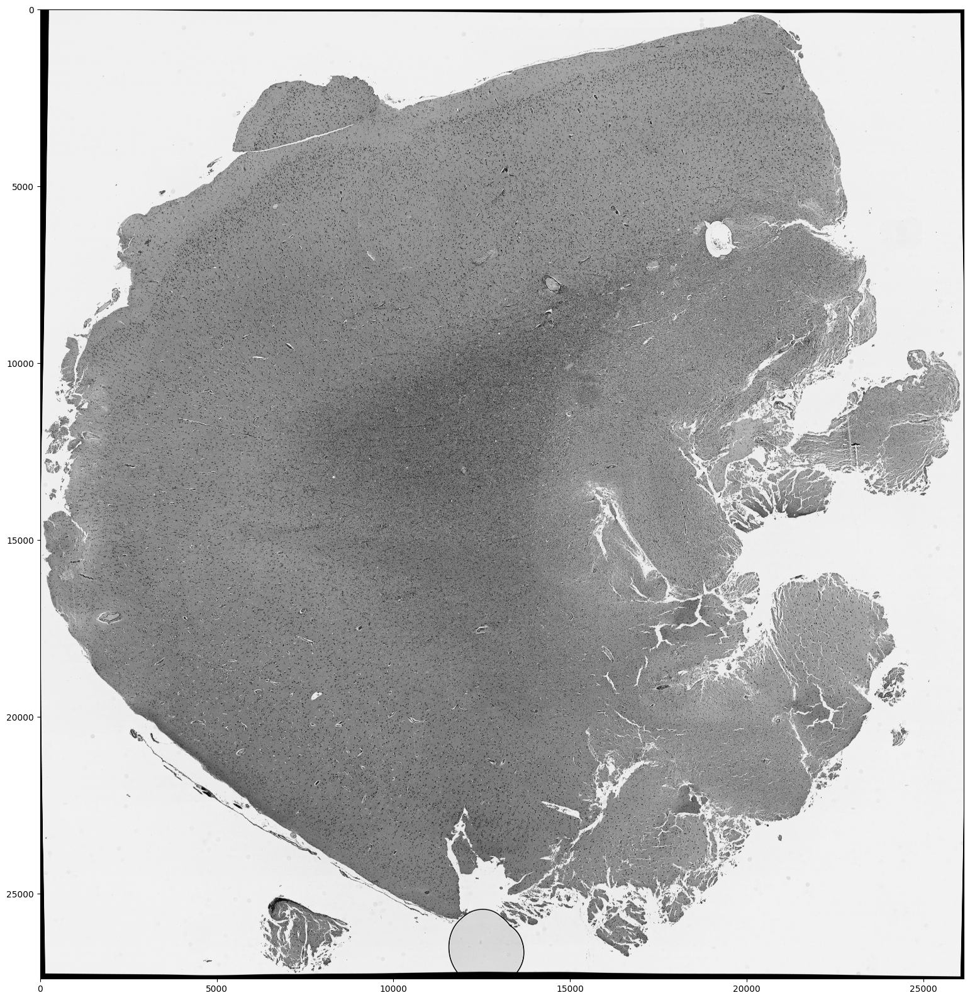

In [15]:
stain_colour_map = {'hematoxylin': [0.52, 0.74, 0.42],
                            'eosin':       [0.27, 0.71, 0.65],
                            'dab':         [0.27, 0.57, 0.78],
                            'null':        [0.00, 0.00, 0.00],
                            }

# Create stain matrix
W = np.array([stain_colour_map['hematoxylin'],
                stain_colour_map['eosin'],
                stain_colour_map['null']]).T

print('Performing color deconvolution...')
# Perform standard color deconvolution
im_stains = htk.preprocessing.color_deconvolution.color_deconvolution(t2_im, W).Stains  
im_nuclei_stain = im_stains[:, :, 0]
print('Completed color deconvolution.')

plt.figure(figsize=(20,20))
plt.imshow(im_nuclei_stain, cmap='gray')

In [11]:
model = StarDist2D.from_pretrained('2D_versatile_he')

Found model '2D_versatile_he' for 'StarDist2D'.
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.692478, nms_thresh=0.3.


In [14]:
from stardist.data import test_image_nuclei_2d
from stardist.plot import render_label
from csbdeep.utils import normalize
import matplotlib.pyplot as plt

# labels, _ = model.predict_instances(normalize(t2_im_arr,0.1,99.8), prob_thresh=0.5, nms_thresh=0.8)
labels, _ = model.predict_instances_big(im_nuclei_stain, axes='YX', block_size=2000, min_overlap=300, context=300, prob_thresh=0.5, nms_thresh=0.8)

effective: block_size=(2000, 2000), min_overlap=(304, 304), context=(304, 304)


  0%|          | 0/600 [00:00<?, ?it/s]


ValueError: 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Text(0.5, 1.0, 'prediction + input overlay')

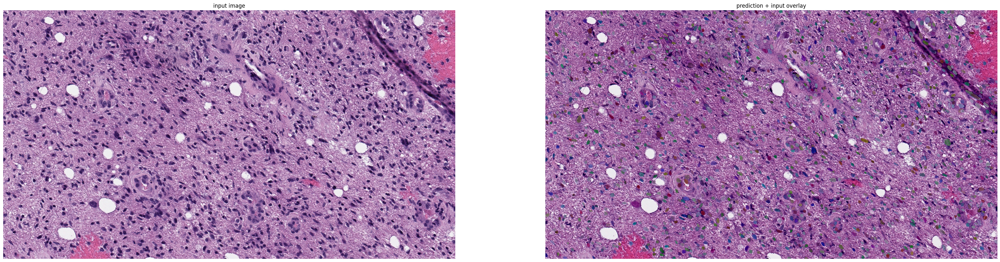

In [11]:
plt.figure(figsize=(40, 20))
plt.subplot(1,2,1)
plt.imshow(t2_im_arr)
plt.axis("off")
plt.title("input image")

plt.subplot(1,2,2)
plt.imshow(render_label(labels, img=t2_im_arr))
plt.axis("off")
plt.title("prediction + input overlay")

In [8]:
tiff.imwrite(f'G:/2024_code/{exp}/{exp}_StarDist2D_prediction.tif', labels.astype('uint16'), bigtiff=True, photometric='minisblack', tile=(256,256), compression='zlib', compressionargs={'level': 3})